<a href="https://colab.research.google.com/github/Suriyaskrs/AQI_COLLECTOR/blob/main/AQI_PREDICTION_MODEL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import scipy.stats as stats
from sklearn import svm
import mlxtend
from scipy.stats import zscore
import matplotlib.pyplot as plt
%matplotlib inline
#Test Train Split
from sklearn import model_selection
from sklearn.model_selection import train_test_split
#Feature Scaling library
from sklearn.preprocessing import StandardScaler
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import confusion_matrix ,jaccard_score, f1_score, log_loss
from sklearn.impute import SimpleImputer
#ROC Curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score

# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Load libraries

from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn import tree
from io import StringIO
import pydotplus
from IPython.display import Image
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
dataset_URL="https://raw.githubusercontent.com/Suriyaskrs/AQI_COLLECTOR/refs/heads/main/data/AQI_dataset.csv"
data=pd.read_csv(dataset_URL)
data.shape

(20500, 15)

In [ ]:
data.head()

,city,lan,lot,timestamp,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,temperature,humidity
0,Delhi,28.6517178,77.221939,2025-01-13 16:29:00,5.0,1335.14,0.00,35.99,44.35,13.59,118.28,163.10,6.27,13.06,94.0
1,Mumbai,19.0785451,72.878176,2025-01-13 16:29:01,5.0,1388.55,0.00,41.13,90.84,39.58,142.07,184.98,15.83,26.03,65.0
2,Chennai,13.0836939,80.270186,2025-01-13 16:29:01,3.0,547.41,0.00,10.11,82.97,8.58,35.92,47.69,2.03,25.73,90.0
3,Kolkata,22.5414185,88.357691,2025-01-13 16:29:02,5.0,9399.41,62.59,252.25,0.00,141.14,821.14,1009.58,100.32,18.95,77.0
4,Bengaluru,12.9767936,77.590082,2025-01-13 16:29:02,2.0,560.76,0.00,17.14,47.92,6.62,14.32,16.55,2.22,20.59,89.0


In [ ]:
data.describe()

,lot,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,temperature,humidity
count,20488.000000,20488.000000,20488.000000,20488.000000,20488.000000,20488.000000,20488.000000,20488.000000,20488.000000,20488.000000,20488.000000,20488.000000
mean,78.924819,4.132809,996.500833,2.524465,25.004762,89.543902,22.036742,101.128811,130.271156,13.563126,25.212818,51.005174
std,4.739580,0.979450,914.087955,8.435314,26.912656,58.990092,23.282029,100.747439,120.746037,12.899622,6.095742,23.986884
min,72.579707,1.000000,88.900000,0.000000,0.010000,0.000000,0.070000,1.640000,2.610000,0.000000,7.600000,2.000000
25%,75.818982,3.000000,494.000000,0.000000,8.740000,45.420000,7.870000,39.430000,58.160000,5.160000,21.040000,32.000000
50%,77.590082,4.000000,720.980000,0.150000,17.140000,82.250000,15.020000,69.180000,92.375000,9.880000,25.960000,50.000000
75%,80.934600,5.000000,1148.220000,1.100000,30.850000,128.750000,27.420000,124.555000,155.632500,17.990000,29.400000,71.000000
max,88.357691,5.000000,11856.080000,168.090000,320.790000,703.810000,297.550000,1183.450000,1348.590000,133.750000,41.790000,100.000000


In [ ]:
data.dtypes

,0
city,object
lan,object
lot,float64
timestamp,object
aqi,float64
co,float64
no,float64
no2,float64
o3,float64
so2,float64


In [ ]:
from sklearn.impute import SimpleImputer
#dt = pd.read_csv("/content/PREPROC.csv")
imputer= SimpleImputer(strategy='mean')
for column in data.columns[4:]:
  data[column] = imputer.fit_transform(data[[column]])
data=data.drop_duplicates()
data=data.T.drop_duplicates().T

In [ ]:
data.isnull().values.any()
# to check If there are any null values in data set

np.False_

In [ ]:
data.dropna(inplace=True)

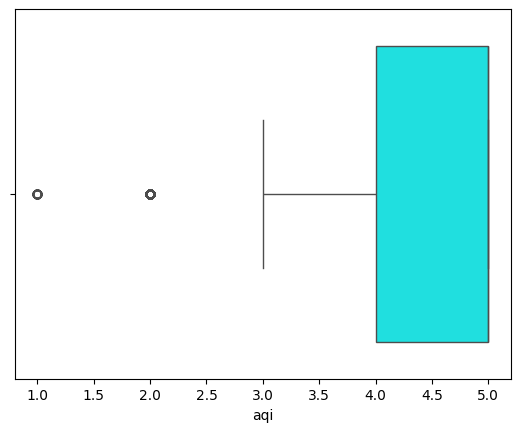

Boxplot of  aqi
Q1 is :  4.0
Q2 is :  5.0
Q3 is :  5.0
IQR is: 1.0
Lower Whisker, Upper Whisker :  2.5 , 6.5
Out of  17030 rows in data, number of outliers are: 764


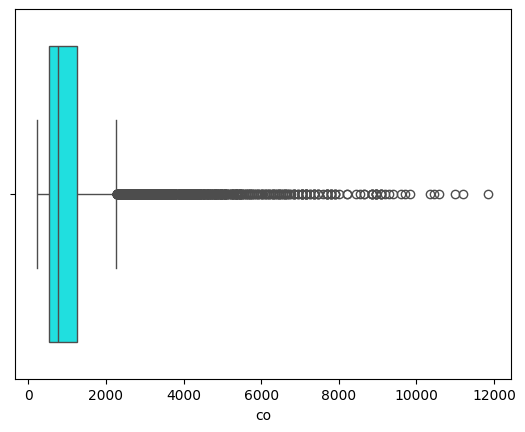

Boxplot of  co
Q1 is :  540.73
Q2 is :  774.38
Q3 is :  1241.68
IQR is: 700.95
Lower Whisker, Upper Whisker :  -510.69500000000016 , 2293.1050000000005
Out of  17030 rows in data, number of outliers are: 1347


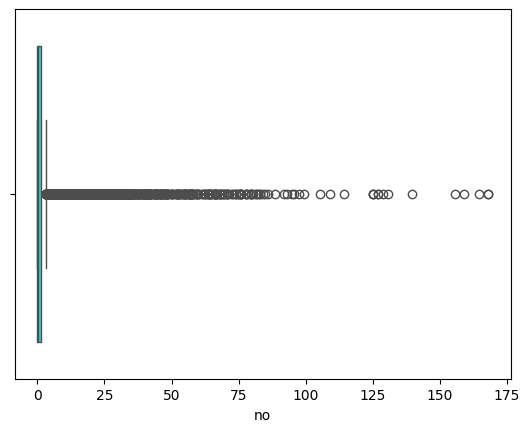

Boxplot of  no
Q1 is :  0.0
Q2 is :  0.19
Q3 is :  1.31
IQR is: 1.31
Lower Whisker, Upper Whisker :  -1.965 , 3.2750000000000004
Out of  17030 rows in data, number of outliers are: 2646


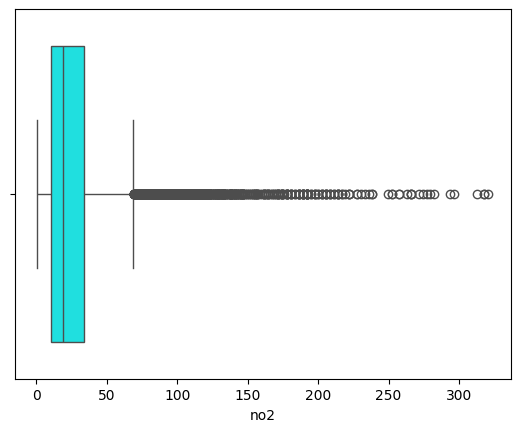

Boxplot of  no2
Q1 is :  10.03
Q2 is :  19.02
Q3 is :  33.59
IQR is: 23.560000000000002
Lower Whisker, Upper Whisker :  -25.310000000000002 , 68.93
Out of  17030 rows in data, number of outliers are: 1146


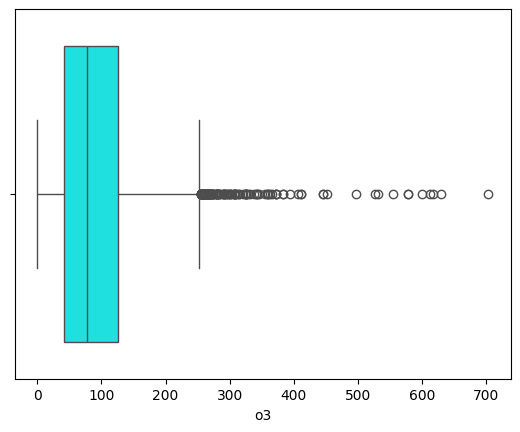

Boxplot of  o3
Q1 is :  41.49
Q2 is :  77.96
Q3 is :  125.89
IQR is: 84.4
Lower Whisker, Upper Whisker :  -85.11000000000001 , 252.49
Out of  17030 rows in data, number of outliers are: 122


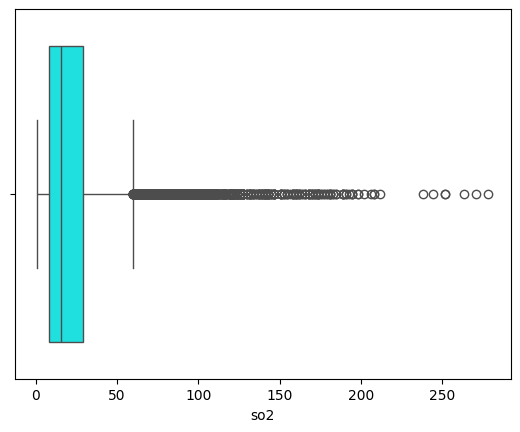

Boxplot of  so2
Q1 is :  8.23
Q2 is :  15.5
Q3 is :  28.85
IQR is: 20.62
Lower Whisker, Upper Whisker :  -22.7 , 59.78
Out of  17030 rows in data, number of outliers are: 1130


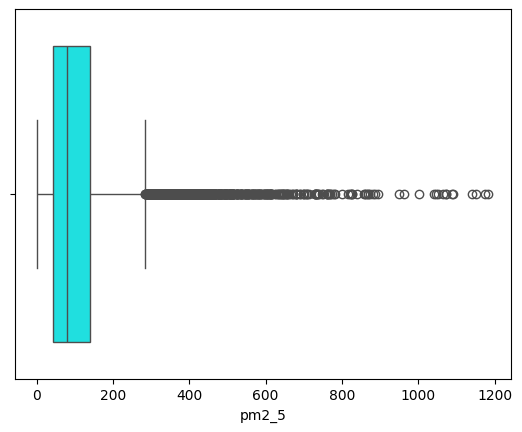

Boxplot of  pm2_5
Q1 is :  44.09
Q2 is :  78.26
Q3 is :  140.3075
IQR is: 96.2175
Lower Whisker, Upper Whisker :  -100.23625000000001 , 284.63375
Out of  17030 rows in data, number of outliers are: 1119


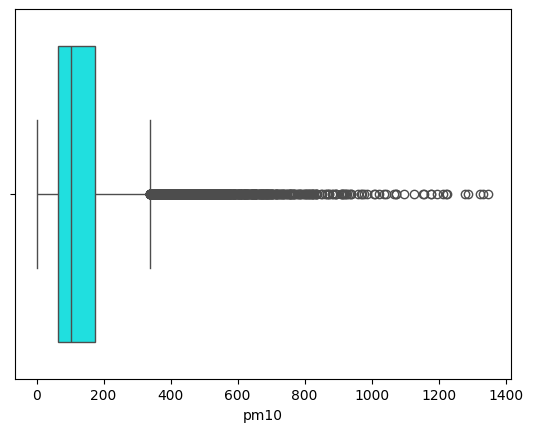

Boxplot of  pm10
Q1 is :  63.0225
Q2 is :  102.19
Q3 is :  173.32500000000002
IQR is: 110.30250000000001
Lower Whisker, Upper Whisker :  -102.43125 , 338.77875000000006
Out of  17030 rows in data, number of outliers are: 1259


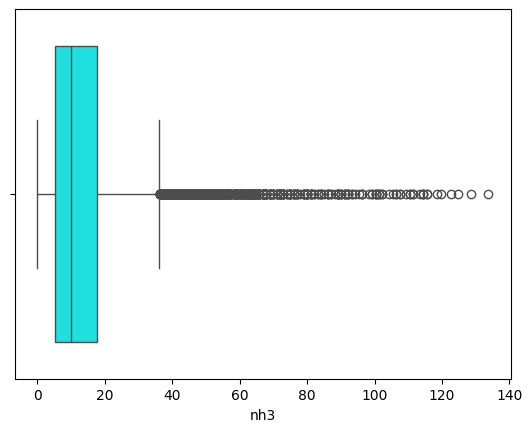

Boxplot of  nh3
Q1 is :  5.26
Q2 is :  10.01
Q3 is :  17.73
IQR is: 12.47
Lower Whisker, Upper Whisker :  -13.445000000000002 , 36.435
Out of  17030 rows in data, number of outliers are: 917


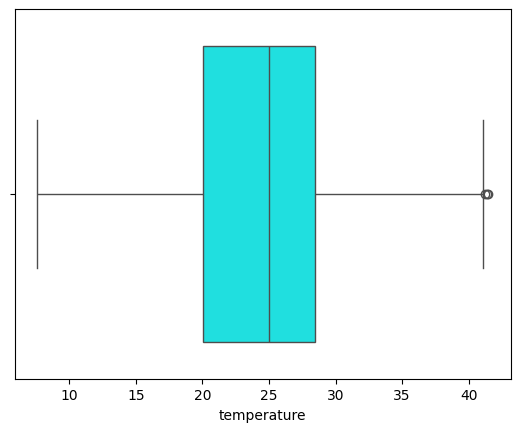

Boxplot of  temperature
Q1 is :  20.04
Q2 is :  24.96
Q3 is :  28.48
IQR is: 8.440000000000001
Lower Whisker, Upper Whisker :  7.379999999999997 , 41.14
Out of  17030 rows in data, number of outliers are: 3


In [ ]:
for column in data.columns[4:len(data.columns)-1]:
    sns.boxplot(x= data[column], color='cyan')
    plt.show()
    print('Boxplot of ',column)
    #calculating the outiers in attribute
    Q1 = data[column].quantile(0.25)
    Q2 = data[column].quantile(0.50)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    L_W = (Q1 - 1.5 *IQR)
    U_W = (Q3 + 1.5 *IQR)
    print('Q1 is : ',Q1)
    print('Q2 is : ',Q2)
    print('Q3 is : ',Q3)
    print('IQR is:',IQR)
    print('Lower Whisker, Upper Whisker : ',L_W,',',U_W)
    bools = (data[column] < (Q1 - 1.5 *IQR)) |(data[column] > (Q3 + 1.5 * IQR))
    print('Out of ',len(data) ,'rows in data, number of outliers are:',bools.sum())   #calculating the number of outliers

In [ ]:
print(data.dtypes)


city           object
lan            object
lot            object
timestamp      object
aqi            object
co             object
no             object
no2            object
o3             object
so2            object
pm2_5          object
pm10           object
nh3            object
temperature    object
humidity       object
dtype: object


In [ ]:
for column in data.columns[4:]:  # Adjust if necessary
    data[column] = pd.to_numeric(data[column], errors='coerce')
data.dtypes

,0
city,object
lan,object
lot,object
timestamp,object
aqi,float64
co,float64
no,float64
no2,float64
o3,float64
so2,float64


<Figure size 300x300 with 0 Axes>

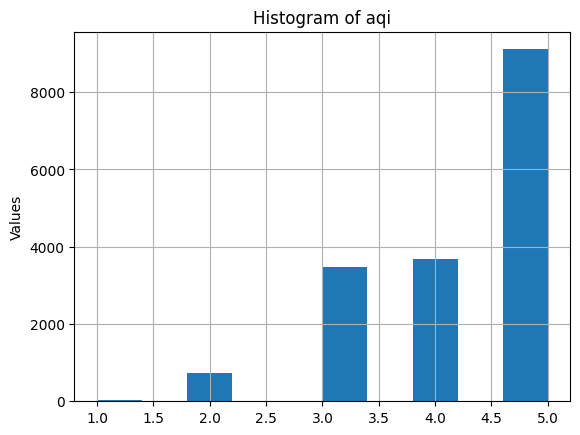

<Figure size 640x480 with 0 Axes>

<Figure size 300x300 with 0 Axes>

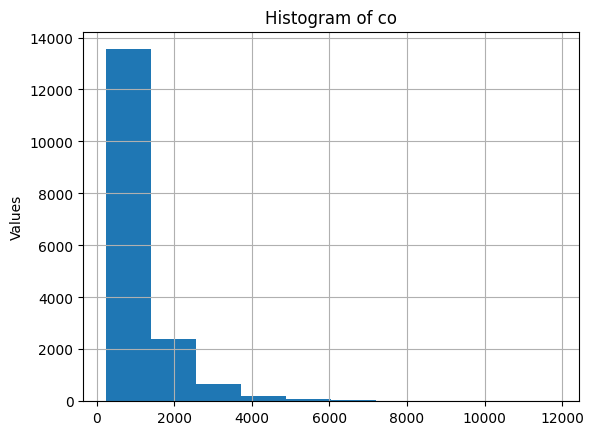

<Figure size 640x480 with 0 Axes>

<Figure size 300x300 with 0 Axes>

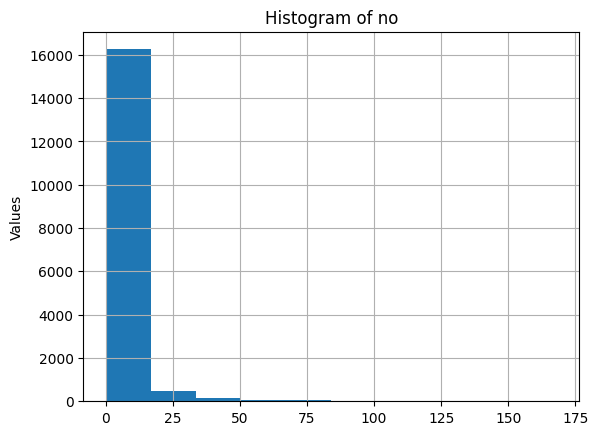

<Figure size 640x480 with 0 Axes>

<Figure size 300x300 with 0 Axes>

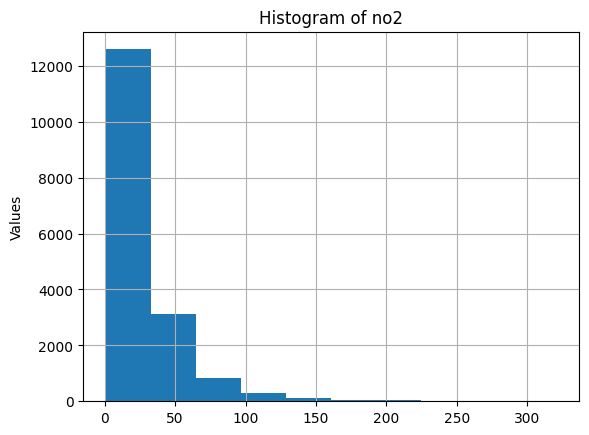

<Figure size 640x480 with 0 Axes>

<Figure size 300x300 with 0 Axes>

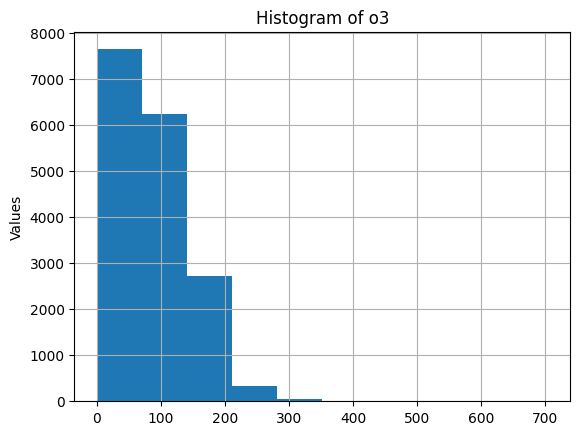

<Figure size 640x480 with 0 Axes>

<Figure size 300x300 with 0 Axes>

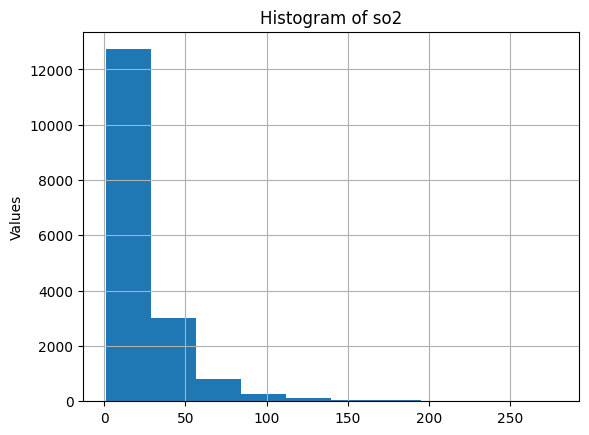

<Figure size 640x480 with 0 Axes>

<Figure size 300x300 with 0 Axes>

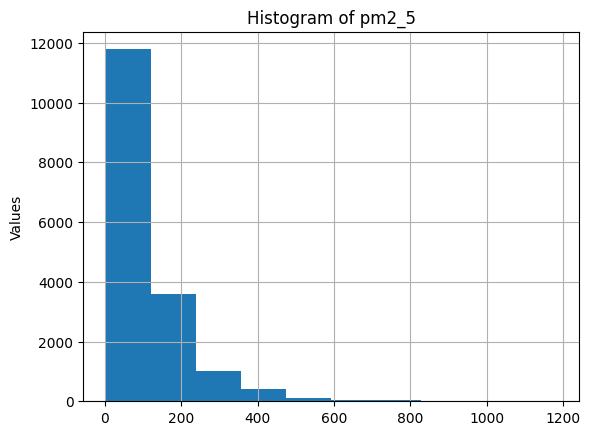

<Figure size 640x480 with 0 Axes>

<Figure size 300x300 with 0 Axes>

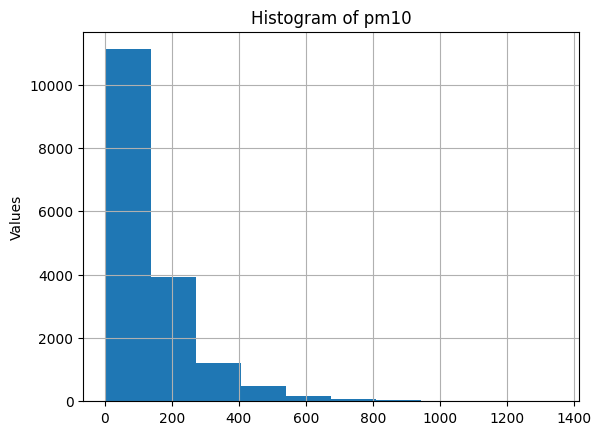

<Figure size 640x480 with 0 Axes>

<Figure size 300x300 with 0 Axes>

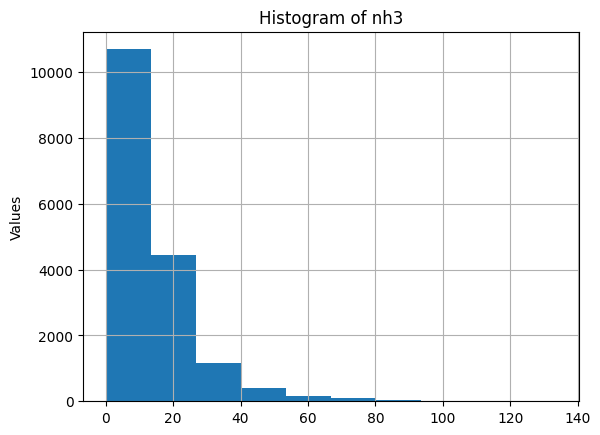

<Figure size 640x480 with 0 Axes>

<Figure size 300x300 with 0 Axes>

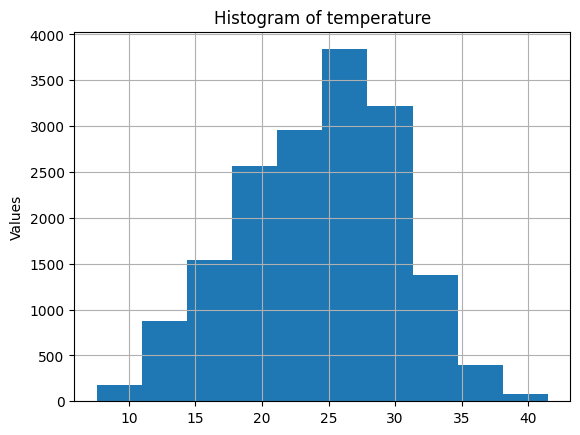

<Figure size 640x480 with 0 Axes>

<Figure size 300x300 with 0 Axes>

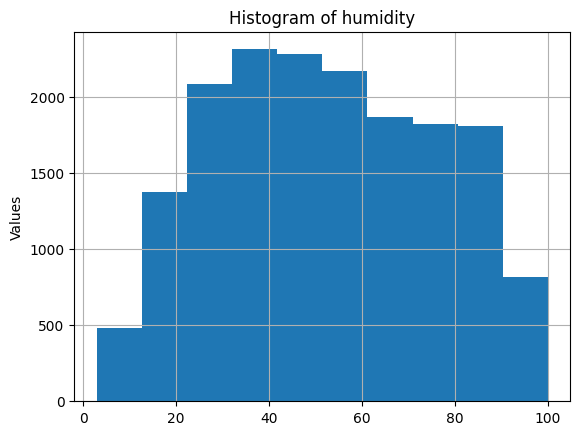

<Figure size 640x480 with 0 Axes>

In [ ]:
for column in data.columns[4:]:  # Check if column is numeric
        plt.figure(figsize=(3, 3))
        data.hist(column)
        plt.title(f'Histogram of {column}')
        plt.ylabel('Values')
        plt.show()
        plt.tight_layout()


<Axes: >

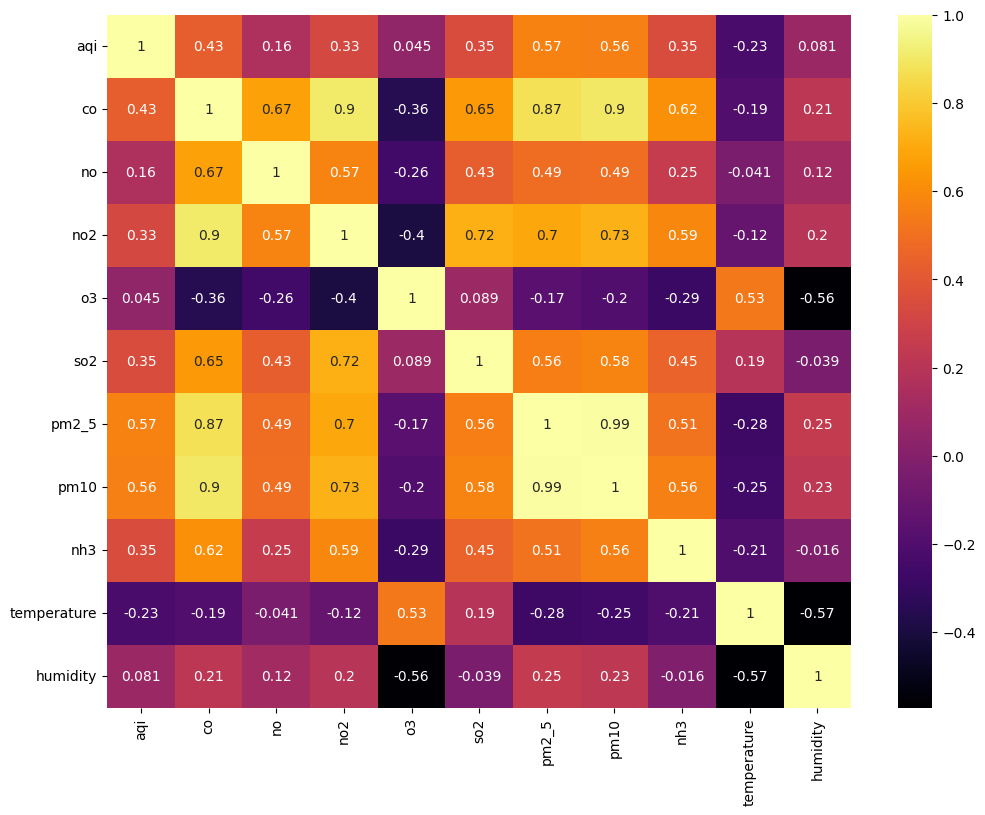

In [ ]:
dt=data.iloc[:,4:]
corr = dt.corr()

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12, 9))

# Draw the heatmap using seaborn
sns.heatmap(corr, cmap='inferno', annot=True)


In [ ]:
data=data.drop(["pm10"],axis=1)

<Axes: >

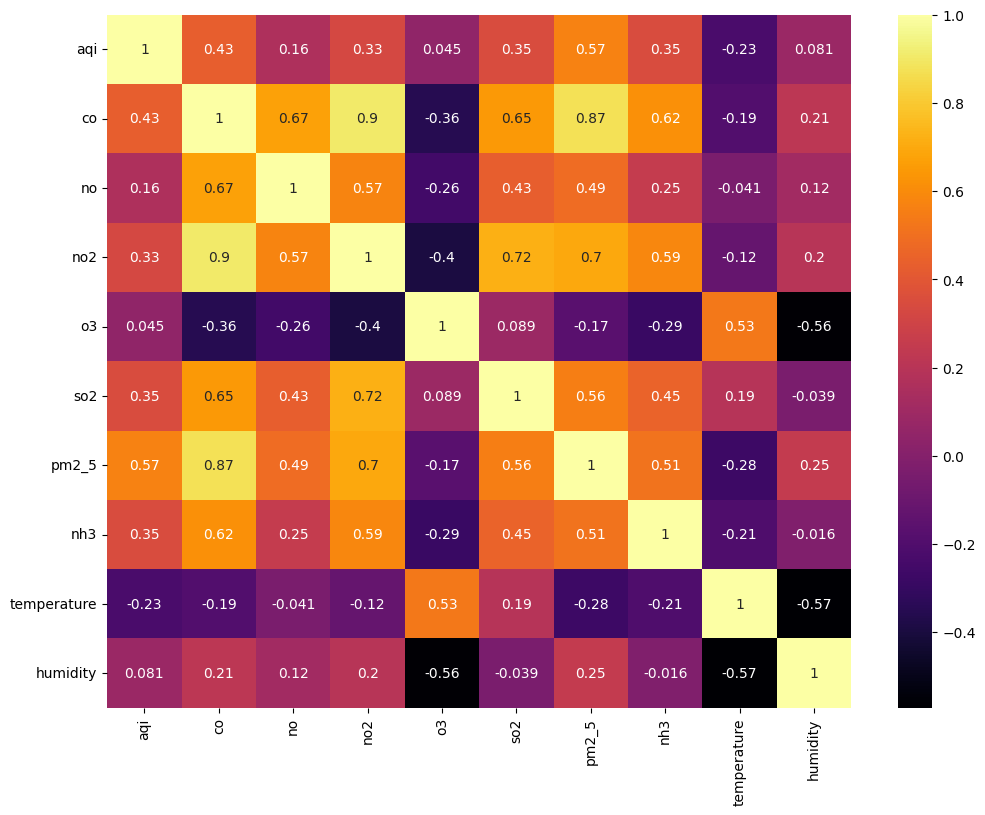

In [ ]:
dt=data.iloc[:,4:]
corr = dt.corr()

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12, 9))

# Draw the heatmap using seaborn
sns.heatmap(corr, cmap='inferno', annot=True)


In [ ]:
# Assuming 'data' is your dataframe
df = data.copy()
#df=df.drop('SUBJECT',axis=1)
# Defining the features (X) and target (y)
X = df.drop(["city","lan","lot","timestamp","aqi"], axis=1)  # Features (all columns except 'status')
y = df['aqi'].astype(int)  # Convert AQI to integer categories
  # Target column (status)

# Scaling the features
SC = StandardScaler()
XSC = SC.fit_transform(X)

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(XSC, y, train_size=0.7, test_size=0.3, random_state=56)
# Verifying the class distribution in training and test sets
print('X_train value counts are:', X_train.shape)
print('y_train value counts are:', y_train.shape)
print('X_test value counts are:', X_test.shape)
print('y_test value counts are:', y_test.shape)

X_train value counts are: (14341, 10)
y_train value counts are: (14341,)
X_test value counts are: (6147, 10)
y_test value counts are: (6147,)


In [ ]:
print(y_train.dtype)
print(y_train[:5])  # Print some values to check if they are continuous


int64
15       4
13014    3
10820    5
14294    2
11917    3
Name: aqi, dtype: int64


Accuracy: 88.59%

Classification Report:
               precision    recall  f1-score   support

           1       0.00      0.00      0.00        13
           2       0.86      0.47      0.61       211
           3       0.78      0.86      0.82      1041
           4       0.80      0.80      0.80      1139
           5       0.97      0.97      0.97      2705

    accuracy                           0.89      5109
   macro avg       0.68      0.62      0.64      5109
weighted avg       0.89      0.89      0.88      5109

Confusion Matrix for Logistic Regression


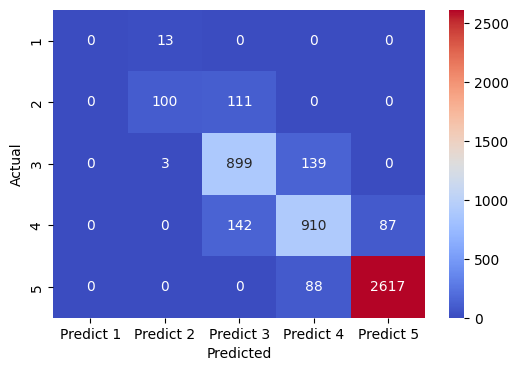

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Fit Logistic Regression model on the training set
logreg = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000)
logreg.fit(X_train, y_train)

# Evaluate the model
y_pred = logreg.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix for multi-class classification
LGRcm_matrix = confusion_matrix(y_test, y_pred)

# Create a DataFrame for the confusion matrix
labels = ['1', '2', '3', '4', '5']  # Change labels based on your AQI classes
HM = pd.DataFrame(LGRcm_matrix, index=labels, columns=['Predict ' + i for i in labels])

# Plot heatmap
plt.figure(figsize=(6,4))
print('Confusion Matrix for Logistic Regression')
sns.heatmap(HM, cmap='coolwarm', annot=True, fmt='g')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()


SVM Accuracy: 92.21%

Classification Report:
               precision    recall  f1-score   support

           1       0.00      0.00      0.00        13
           2       0.88      0.51      0.64       211
           3       0.85      0.92      0.88      1041
           4       0.87      0.89      0.88      1139
           5       0.98      0.97      0.97      2705

    accuracy                           0.92      5109
   macro avg       0.71      0.66      0.68      5109
weighted avg       0.92      0.92      0.92      5109

Confusion Matrix for SVM


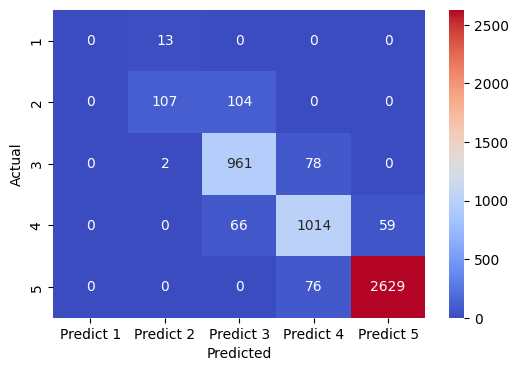

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Train the SVM model
svm_model = SVC(kernel='rbf', C=1.0, gamma='scale', decision_function_shape='ovo')  # 'ovo' for multi-class
svm_model.fit(X_train, y_train)

# Predict on test data
y_pred = svm_model.predict(X_test)

# Model evaluation
accuracy = accuracy_score(y_test, y_pred)
print("SVM Accuracy: {:.2f}%".format(accuracy * 100))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix
svm_cm_matrix = confusion_matrix(y_test, y_pred)

# Create a DataFrame for the confusion matrix
HM = pd.DataFrame(svm_cm_matrix, index=labels, columns=['Predict ' + i for i in labels])

# Plot heatmap
plt.figure(figsize=(6, 4))
print('Confusion Matrix for SVM')
sns.heatmap(HM, cmap='coolwarm', annot=True, fmt='g')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()


KNN Accuracy: 87.41%

Classification Report:
               precision    recall  f1-score   support

           1       0.85      0.85      0.85        13
           2       0.78      0.75      0.76       211
           3       0.82      0.83      0.83      1041
           4       0.76      0.77      0.76      1139
           5       0.95      0.94      0.95      2705

    accuracy                           0.87      5109
   macro avg       0.83      0.83      0.83      5109
weighted avg       0.87      0.87      0.87      5109

Confusion Matrix for KNN


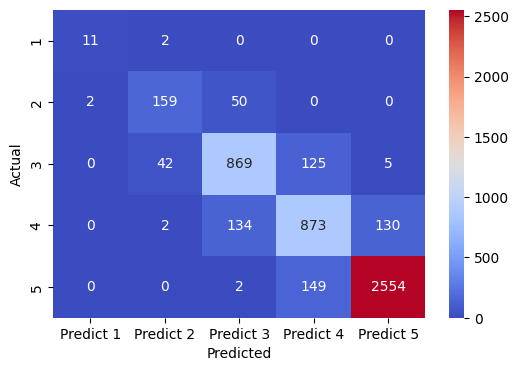

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Train the KNN model
k = 1  # You can tune this value
knn_model = KNeighborsClassifier(n_neighbors=k)
knn_model.fit(X_train, y_train)

# Predict on test data
y_pred = knn_model.predict(X_test)

# Model evaluation
accuracy = accuracy_score(y_test, y_pred)
print("KNN Accuracy: {:.2f}%".format(accuracy * 100))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix
knn_cm_matrix = confusion_matrix(y_test, y_pred)

# Create a DataFrame for the confusion matrix
HM = pd.DataFrame(knn_cm_matrix, index=labels, columns=['Predict ' + i for i in labels])

# Plot heatmap
plt.figure(figsize=(6, 4))
print('Confusion Matrix for KNN')
sns.heatmap(HM, cmap='coolwarm', annot=True, fmt='g')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()


Decision Tree Accuracy: 99.22%

Classification Report:
               precision    recall  f1-score   support

           1       0.00      0.00      0.00        13
           2       0.87      1.00      0.93       211
           3       0.99      0.98      0.99      1041
           4       1.00      0.99      1.00      1139
           5       1.00      1.00      1.00      2705

    accuracy                           0.99      5109
   macro avg       0.77      0.79      0.78      5109
weighted avg       0.99      0.99      0.99      5109



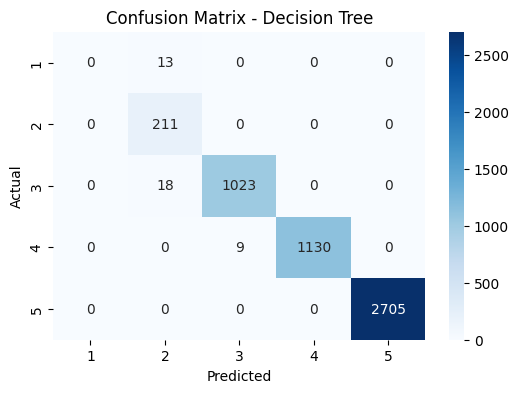

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Initialize Decision Tree model
tree_model = DecisionTreeClassifier(max_depth=5, random_state=42)

# Train model
tree_model.fit(X_train, y_train)

# Predict
y_pred_tree = tree_model.predict(X_test)

# Evaluate
accuracy = accuracy_score(y_test, y_pred_tree)
print("Decision Tree Accuracy: {:.2f}%".format(accuracy * 100))
print("\nClassification Report:\n", classification_report(y_test, y_pred_tree))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_tree)

# Plot Confusion Matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Decision Tree")
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Normalize features
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build ANN model
ann_model = Sequential([
    Dense(128, activation='relu', input_shape=(X_train.shape[1],)),  # Input layer
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1)  # Output layer (predicting AQI)
])

# Compile model
ann_model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# Train the model
history = ann_model.fit(X_train_scaled, y_train, epochs=50, batch_size=32, validation_data=(X_test_scaled, y_test), verbose=1)

# Predict on test data
y_pred_ann = ann_model.predict(X_test_scaled)

# Evaluate model
mae = mean_absolute_error(y_test, y_pred_ann)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_ann))
r2 = r2_score(y_test, y_pred_ann)

print(f"ANN Metrics:")
print(f"MAE: {mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R² Score: {r2:.4f}")


Epoch 1/50
373/373 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 4.7069 - mae: 1.5793 - val_loss: 0.3925 - val_mae: 0.4995
Epoch 2/50
373/373 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3317 - mae: 0.4521 - val_loss: 0.1755 - val_mae: 0.3116
Epoch 3/50
373/373 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.1479 - mae: 0.2905 - val_loss: 0.1244 - val_mae: 0.2834
Epoch 4/50
373/373 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0993 - mae: 0.2379 - val_loss: 0.0887 - val_mae: 0.2275
Epoch 5/50
373/373 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0785 - mae: 0.2048 - val_loss: 0.0757 - val_mae: 0.1992
Epoch 6/50
373/373 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0756 - mae: 0.2030 - val_loss: 0.0721 - val_mae: 0.1942
Epoch 7/50
373/373 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0714 - mae: 0.1943 - val_loss: 0.0723 - val_mae: 0.1899
Epoch 8/50
373/373 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0713 - mae: 0.1955 - val_loss: 0.0733 - val_mae: 0.2115
Epoch 9/50
373/373 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - lo

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Initialize Naïve Bayes model
nb_model = GaussianNB()

# Train the model
nb_model.fit(X_train, y_train)

# Predict on test data
y_pred_nb = nb_model.predict(X_test)

# Model evaluation
accuracy = accuracy_score(y_test, y_pred_nb)
print("Naïve Bayes Accuracy: {:.2f}%".format(accuracy * 100))
print("\nClassification Report:\n", classification_report(y_test, y_pred_nb))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_nb)

# Plot Confusion Matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Naïve Bayes")
plt.show()


ValueError: Found array with dim 3. GaussianNB expected <= 2.

Random Forest Accuracy: 99.41%

Classification Report:
               precision    recall  f1-score   support

           1       0.92      0.85      0.88        13
           2       0.93      0.98      0.95       211
           3       0.99      0.99      0.99      1041
           4       1.00      0.99      1.00      1139
           5       1.00      1.00      1.00      2705

    accuracy                           0.99      5109
   macro avg       0.97      0.96      0.96      5109
weighted avg       0.99      0.99      0.99      5109

Confusion Matrix for Random Forest


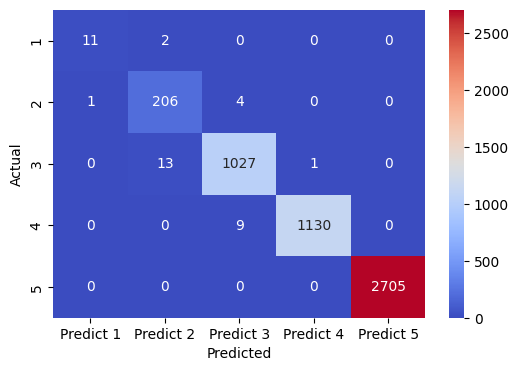

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Train the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predict on test data
y_pred = rf_model.predict(X_test)

# Model evaluation
accuracy = accuracy_score(y_test, y_pred)
print("Random Forest Accuracy: {:.2f}%".format(accuracy * 100))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix
rf_cm_matrix = confusion_matrix(y_test, y_pred)

# Create a DataFrame for the confusion matrix
HM = pd.DataFrame(rf_cm_matrix, index=labels, columns=['Predict ' + i for i in labels])

# Plot heatmap
plt.figure(figsize=(6, 4))
print('Confusion Matrix for Random Forest')
sns.heatmap(HM, cmap='coolwarm', annot=True, fmt='g')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()


XGBoost Accuracy: 99.12%

Classification Report:
               precision    recall  f1-score   support

           1       0.92      0.92      0.92        13
           2       0.95      0.96      0.95       211
           3       0.98      0.99      0.98      1041
           4       0.99      0.99      0.99      1139
           5       1.00      1.00      1.00      2705

    accuracy                           0.99      5109
   macro avg       0.97      0.97      0.97      5109
weighted avg       0.99      0.99      0.99      5109

Confusion Matrix for XGBoost


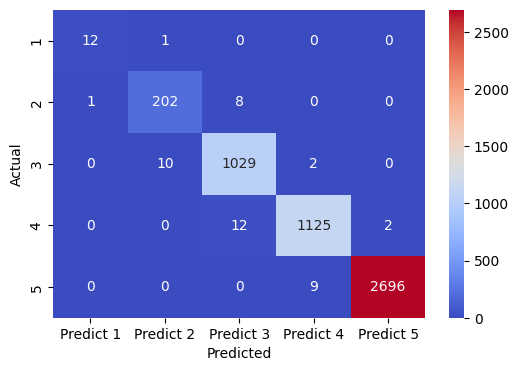

In [ ]:
# Adjust class labels to start from 0
y_train_adj = y_train - 1
y_test_adj = y_test - 1

# Train the XGBoost model
xgb_model = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42)
xgb_model.fit(X_train, y_train_adj)

# Predict on test data
y_pred_adj = xgb_model.predict(X_test)

# Convert predictions back to original labels (shift back)
y_pred = y_pred_adj + 1

# Model evaluation
accuracy = accuracy_score(y_test, y_pred)
print("XGBoost Accuracy: {:.2f}%".format(accuracy * 100))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix
xgb_cm_matrix = confusion_matrix(y_test, y_pred)

# Create a DataFrame for the confusion matrix
HM = pd.DataFrame(xgb_cm_matrix, index=labels, columns=['Predict ' + i for i in labels])

# Plot heatmap
plt.figure(figsize=(6, 4))
print('Confusion Matrix for XGBoost')
sns.heatmap(HM, cmap='coolwarm', annot=True, fmt='g')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()


Voting Classifier Accuracy: 99.30%

Classification Report:
               precision    recall  f1-score   support

           1       1.00      0.69      0.82        13
           2       0.94      0.96      0.95       211
           3       0.98      0.99      0.99      1041
           4       1.00      0.99      0.99      1139
           5       1.00      1.00      1.00      2705

    accuracy                           0.99      5109
   macro avg       0.98      0.93      0.95      5109
weighted avg       0.99      0.99      0.99      5109

Confusion Matrix for Voting Classifier


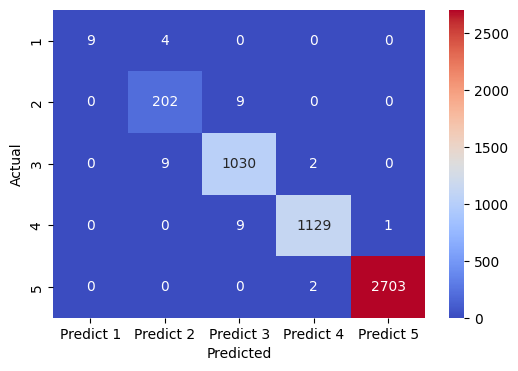

In [ ]:
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Adjust class labels if necessary (ensure labels start from 0)
y_train_adj = y_train - min(y_train)
y_test_adj = y_test - min(y_test)

# Define individual models
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)
xgboost = XGBClassifier(n_estimators=100, learning_rate=0.05, max_depth=6, random_state=42)
logistic = LogisticRegression(max_iter=1000, solver='lbfgs', multi_class='auto')

# Create a Voting Classifier with soft voting
voting_clf = VotingClassifier(
    estimators=[
        ('rf', random_forest),
        ('xgb', xgboost),
        ('lr', logistic)
    ],
    voting='soft'  # Change to 'hard' for majority voting
)

# Train the Voting Classifier
voting_clf.fit(X_train, y_train_adj)

# Predict on test data
y_pred_adj = voting_clf.predict(X_test)

# Convert predictions back to original labels (if necessary)
y_pred = y_pred_adj + min(y_train)

# Model evaluation
accuracy = accuracy_score(y_test, y_pred)
print("Voting Classifier Accuracy: {:.2f}%".format(accuracy * 100))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix
vc_cm_matrix = confusion_matrix(y_test, y_pred)

# Create a DataFrame for the confusion matrix
HM = pd.DataFrame(vc_cm_matrix, index=labels, columns=['Predict ' + i for i in labels])

# Plot heatmap
plt.figure(figsize=(6, 4))
print('Confusion Matrix for Voting Classifier')
sns.heatmap(HM, cmap='coolwarm', annot=True, fmt='g')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()


AdaBoost Accuracy: 99.41%

Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.77      0.83        13
           1       0.94      0.98      0.96       211
           2       0.99      0.99      0.99      1041
           3       1.00      0.99      1.00      1139
           4       1.00      1.00      1.00      2705

    accuracy                           0.99      5109
   macro avg       0.97      0.95      0.95      5109
weighted avg       0.99      0.99      0.99      5109



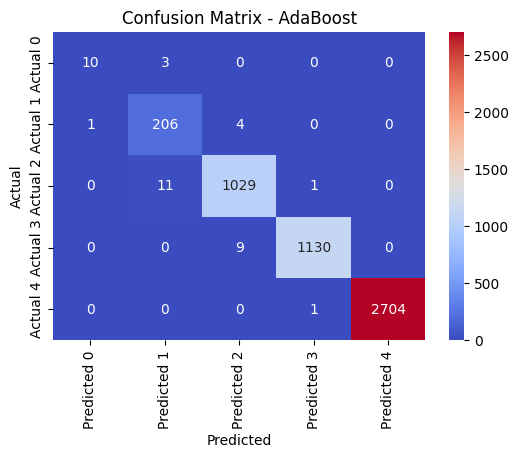

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Adjust class labels if necessary
y_train_adj = y_train - min(y_train)
y_test_adj = y_test - min(y_test)

# Define base estimator (weak learner)
base_learner = RandomForestClassifier(n_estimators=100, random_state=42)

# Create AdaBoost model (Use `estimator` instead of `base_estimator`)
adaboost = AdaBoostClassifier(estimator=base_learner, n_estimators=50, learning_rate=0.1, random_state=42)

# Train AdaBoost model
adaboost.fit(X_train, y_train_adj)

# Predict on test data
y_pred = adaboost.predict(X_test)

# Evaluate model
accuracy = accuracy_score(y_test_adj, y_pred)
print("AdaBoost Accuracy: {:.2f}%".format(accuracy * 100))
print("\nClassification Report:\n", classification_report(y_test_adj, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test_adj, y_pred)

# Create DataFrame for confusion matrix
cm_df = pd.DataFrame(cm, index=["Actual " + str(i) for i in range(len(cm))],
                     columns=["Predicted " + str(i) for i in range(len(cm))])

# Plot confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm_df, cmap='coolwarm', annot=True, fmt='g')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix - AdaBoost')
plt.show()


Training model for Delhi...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.3804 - mae: 0.4939 - val_loss: 0.0676 - val_mae: 0.2173
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0464 - mae: 0.1760 - val_loss: 0.0719 - val_mae: 0.2247
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.0398 - mae: 0.1510 - val_loss: 0.0579 - val_mae: 0.2089
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step - loss: 0.0359 - mae: 0.1400 - val_loss: 0.0571 - val_mae: 0.2075
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - loss: 0.0351 - mae: 0.1365 - val_loss: 0.0444 - val_mae: 0.1772
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.0324 - mae: 0.1271 - val_loss: 0.0557 - val_mae: 0.1983
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - loss: 0.0296 - mae: 0.1220 - val_loss: 0.0390 - val_mae: 0.1637
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0270 - mae: 0.1108 - val_loss: 0.0346 - val_mae: 0.1513
Epoch 9/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0

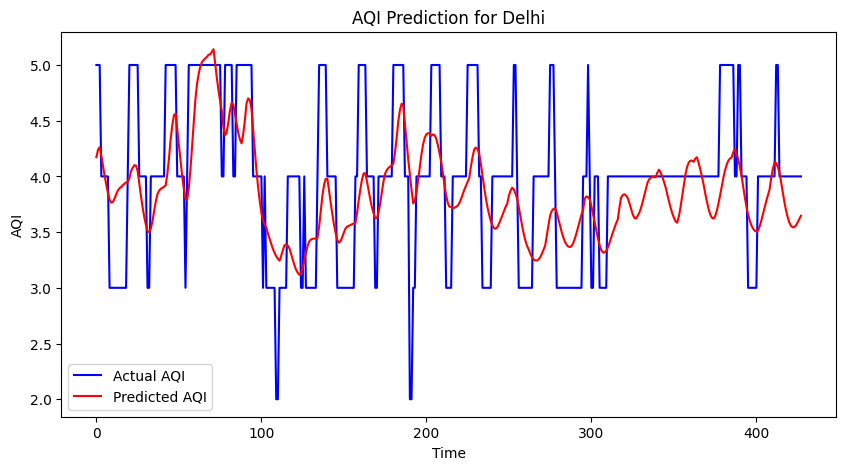

Training model for Mumbai...
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


54/54 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.3303 - mae: 0.4583 - val_loss: 0.2944 - val_mae: 0.4613
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0483 - mae: 0.1779 - val_loss: 0.1797 - val_mae: 0.3663
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - loss: 0.0415 - mae: 0.1546 - val_loss: 0.1193 - val_mae: 0.3018
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.0382 - mae: 0.1500 - val_loss: 0.0966 - val_mae: 0.2638
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step - loss: 0.0387 - mae: 0.1506 - val_loss: 0.0797 - val_mae: 0.2336
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0327 - mae: 0.1359 - val_loss: 0.1070 - val_mae: 0.2634
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.0364 - mae: 0.1444 - val_loss: 0.0880 - val_mae: 0.2467
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0309 - mae: 0.1316 - val_loss: 0.0853 - val_mae: 0.2441
Epoch 9/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.0303 - mae: 0.

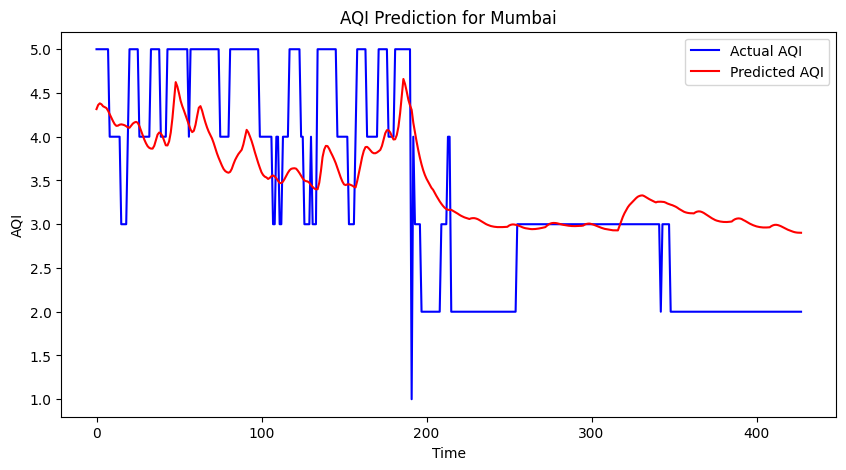

Training model for Chennai...
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - loss: 0.2599 - mae: 0.4161 - val_loss: 0.0531 - val_mae: 0.1894
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.0348 - mae: 0.1493 - val_loss: 0.0355 - val_mae: 0.1531
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.0276 - mae: 0.1355 - val_loss: 0.0425 - val_mae: 0.1617
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.0273 - mae: 0.1325 - val_loss: 0.0341 - val_mae: 0.1459
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0198 - mae: 0.1101 - val_loss: 0.0304 - val_mae: 0.1385
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.0186 - mae: 0.1077 - val_loss: 0.0270 - val_mae: 0.1303
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0166 - mae: 0.0999 - val_loss: 0.0238 - val_mae: 0.1211
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step - loss: 0.0153 - mae: 0.0939 - val_loss: 0.0292 - val_mae: 0.1383
Epoch 9/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step - loss: 0.0147 - mae: 0.

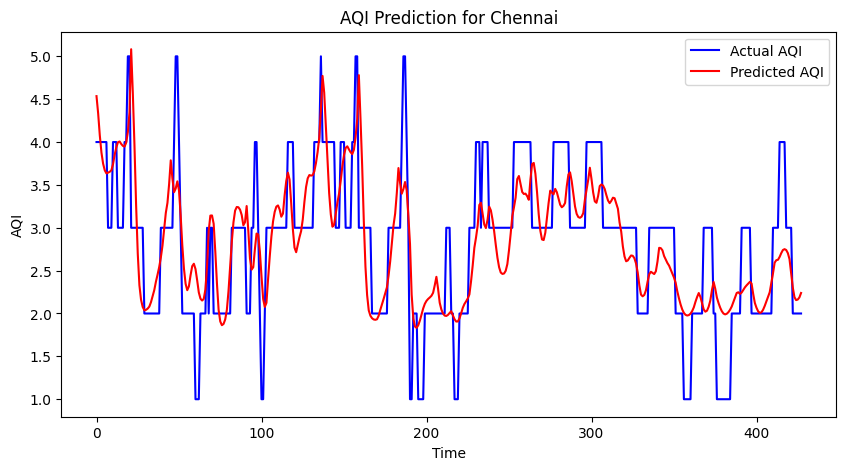

Training model for Kolkata...
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


54/54 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.3198 - mae: 0.4127 - val_loss: 0.5087 - val_mae: 0.6110
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0157 - mae: 0.0723 - val_loss: 0.5160 - val_mae: 0.6166
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0154 - mae: 0.0674 - val_loss: 0.4534 - val_mae: 0.5742
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.0155 - mae: 0.0735 - val_loss: 0.4405 - val_mae: 0.5650
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - loss: 0.0156 - mae: 0.0705 - val_loss: 0.4150 - val_mae: 0.5472
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - loss: 0.0156 - mae: 0.0738 - val_loss: 0.4271 - val_mae: 0.5559
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - loss: 0.0159 - mae: 0.0718 - val_loss: 0.2954 - val_mae: 0.4484
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - loss: 0.0115 - mae: 0.0640 - val_loss: 0.4330 - val_mae: 0.5580
Epoch 9/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.0150 - mae: 0.

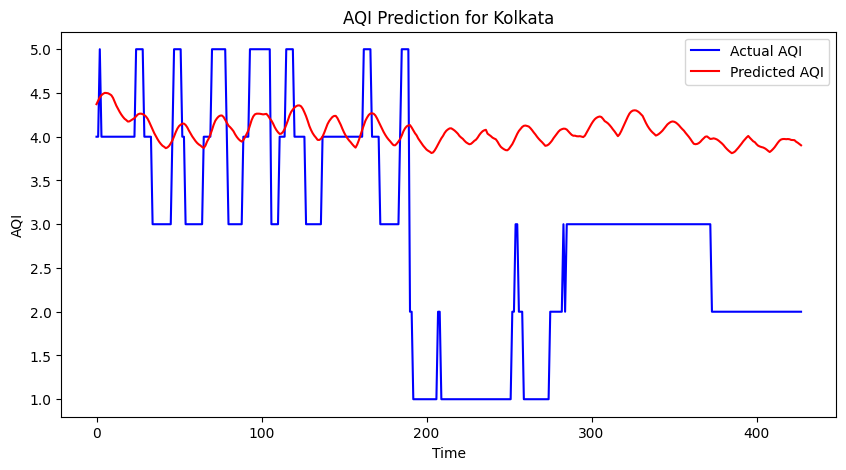

Training model for Bengaluru...
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


54/54 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - loss: 0.0704 - mae: 0.2016 - val_loss: 0.0228 - val_mae: 0.1206
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step - loss: 0.0279 - mae: 0.1299 - val_loss: 0.0162 - val_mae: 0.0946
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.0233 - mae: 0.1192 - val_loss: 0.0178 - val_mae: 0.1046
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.0189 - mae: 0.1080 - val_loss: 0.0186 - val_mae: 0.1077
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - loss: 0.0187 - mae: 0.1062 - val_loss: 0.0175 - val_mae: 0.1037
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.0143 - mae: 0.0951 - val_loss: 0.0171 - val_mae: 0.1001
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.0152 - mae: 0.0961 - val_loss: 0.0162 - val_mae: 0.0983
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step


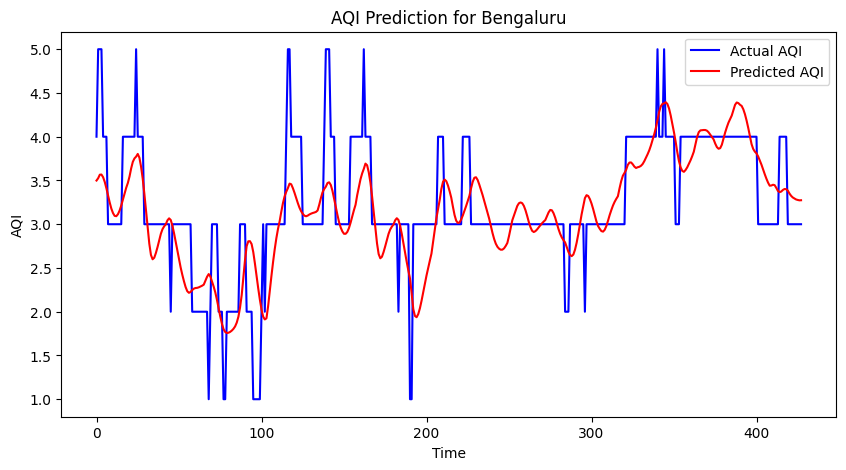

Training model for Ahmedabad...
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1352 - mae: 0.2800 - val_loss: 0.0582 - val_mae: 0.1505
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - loss: 0.0409 - mae: 0.1523 - val_loss: 0.0383 - val_mae: 0.1373
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0323 - mae: 0.1422 - val_loss: 0.0312 - val_mae: 0.1369
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.0304 - mae: 0.1415 - val_loss: 0.0327 - val_mae: 0.1450
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.0270 - mae: 0.1351 - val_loss: 0.0506 - val_mae: 0.1749
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0240 - mae: 0.1272 - val_loss: 0.0276 - val_mae: 0.1280
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 0.0235 - mae: 0.1236 - val_loss: 0.0468 - val_mae: 0.1662
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - loss: 0.0203 - mae: 0.1172 - val_loss: 0.0457 - val_mae: 0.1635
Epoch 9/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0200 - mae: 0.

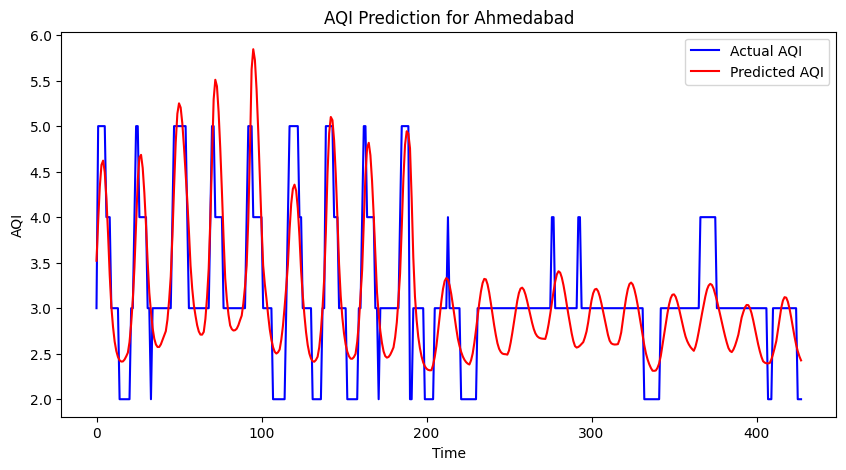

Training model for Lucknow...
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


54/54 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.1505 - mae: 0.2839 - val_loss: 0.0593 - val_mae: 0.1867
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - loss: 0.0342 - mae: 0.1470 - val_loss: 0.0796 - val_mae: 0.2379
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0274 - mae: 0.1260 - val_loss: 0.0926 - val_mae: 0.2644
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.0260 - mae: 0.1184 - val_loss: 0.0630 - val_mae: 0.2093
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0227 - mae: 0.1122 - val_loss: 0.0719 - val_mae: 0.2272
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - loss: 0.0215 - mae: 0.1071 - val_loss: 0.0867 - val_mae: 0.2518
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step


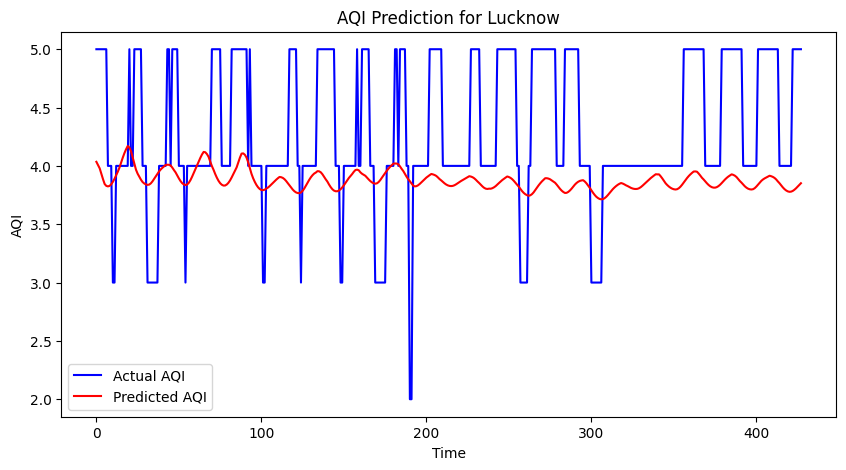

Training model for Hyderabad...
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


54/54 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1176 - mae: 0.2668 - val_loss: 0.0580 - val_mae: 0.1806
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.0432 - mae: 0.1680 - val_loss: 0.0781 - val_mae: 0.2327
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - loss: 0.0367 - mae: 0.1526 - val_loss: 0.0499 - val_mae: 0.1630
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 0.0358 - mae: 0.1496 - val_loss: 0.0947 - val_mae: 0.2667
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step - loss: 0.0322 - mae: 0.1417 - val_loss: 0.0524 - val_mae: 0.1866
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0318 - mae: 0.1410 - val_loss: 0.0832 - val_mae: 0.2450
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - loss: 0.0292 - mae: 0.1330 - val_loss: 0.0978 - val_mae: 0.2681
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0236 - mae: 0.1179 - val_loss: 0.0599 - val_mae: 0.1997
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step


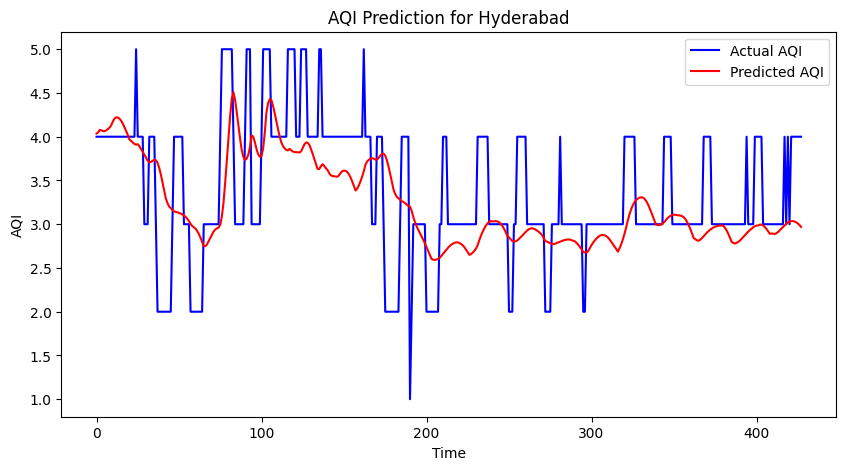

Training model for Jaipur...
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


54/54 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.1410 - mae: 0.2930 - val_loss: 0.0428 - val_mae: 0.1724
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.0438 - mae: 0.1720 - val_loss: 0.0522 - val_mae: 0.1784
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.0391 - mae: 0.1582 - val_loss: 0.0476 - val_mae: 0.1840
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0403 - mae: 0.1638 - val_loss: 0.0487 - val_mae: 0.1714
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0357 - mae: 0.1524 - val_loss: 0.0654 - val_mae: 0.2134
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.0326 - mae: 0.1436 - val_loss: 0.0641 - val_mae: 0.2138
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step


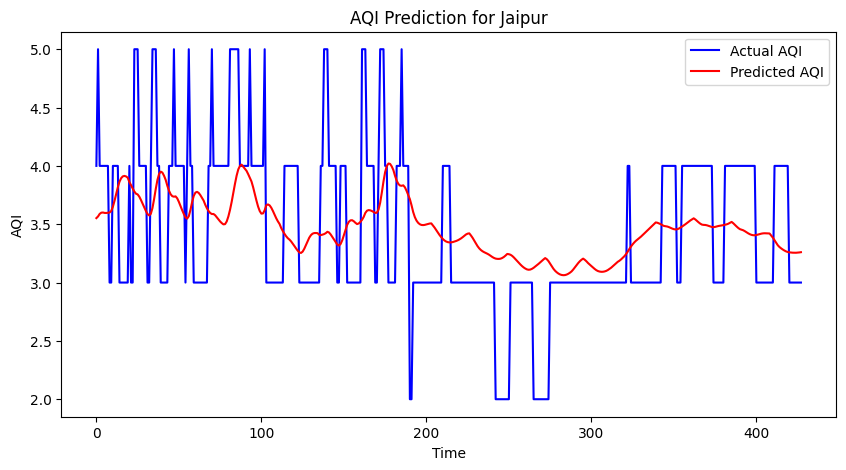

Training model for Patna...
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - loss: 0.1687 - mae: 0.3060 - val_loss: 0.0505 - val_mae: 0.1824
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.0248 - mae: 0.1142 - val_loss: 0.1292 - val_mae: 0.3223
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step - loss: 0.0196 - mae: 0.0893 - val_loss: 0.1827 - val_mae: 0.3748
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0154 - mae: 0.0791 - val_loss: 0.1790 - val_mae: 0.3617
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.0135 - mae: 0.0691 - val_loss: 0.1568 - val_mae: 0.3352
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.0134 - mae: 0.0724 - val_loss: 0.1742 - val_mae: 0.3597
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step


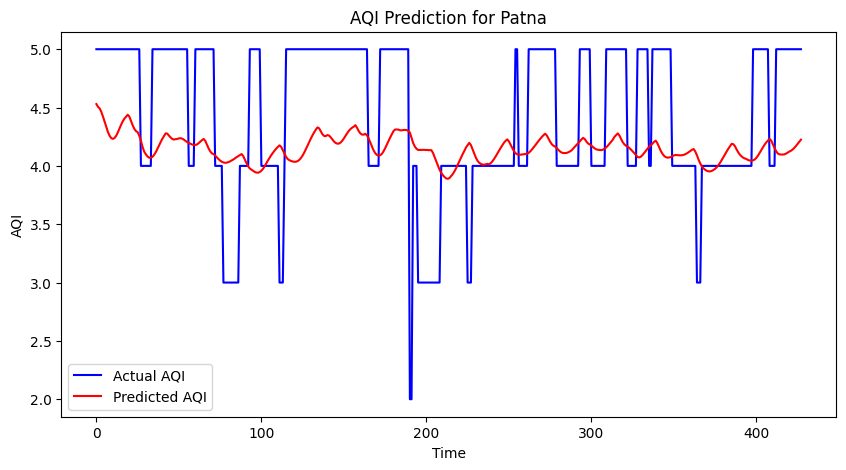

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
import tensorboard

# Load dataset
url = "https://raw.githubusercontent.com/Suriyaskrs/AQI_COLLECTOR/refs/heads/main/data/AQI_dataset.csv"
data = pd.read_csv(url)
data.dropna(inplace=True)  # or use fillna with suitable values


# Convert 'timestamp' to datetime format
data['datetime'] = pd.to_datetime(data['timestamp'])

# Extract useful time-based features
data['hour'] = data['datetime'].dt.hour
data['day_of_week'] = data['datetime'].dt.weekday
data['month'] = data['datetime'].dt.month

# Select features and target
features = ["co", "no", "no2", "o3", "so2", "pm2_5", "pm10", "nh3", "temperature", "humidity", "hour", "day_of_week", "month"]
target = "aqi"

# Normalize features
feature_scaler = MinMaxScaler()
target_scaler = MinMaxScaler()

# Function to train LSTM for each city
def train_lstm_for_city(city_name, epochs=50):
    city_data = data[data["city"] == city_name].copy()  # Create a separate copy

    # Normalize features
    feature_scaler.fit(city_data[features][:int(0.8 * len(city_data))])  # Fit only on training data
    city_data[features] = feature_scaler.transform(city_data[features])

    # Normalize target (AQI)
    target_scaler.fit(city_data[[target]][:int(0.8 * len(city_data))])  # Fit only on training data
    city_data[target] = target_scaler.transform(city_data[[target]])

    # Function to create sequences
    def create_sequences(df, seq_length=48):
        X, y = [], []
        for i in range(len(df) - seq_length):
            X.append(df.iloc[i:i+seq_length][features].values)
            y.append(df.iloc[i+seq_length][target])
        return np.array(X), np.array(y)

    # Generate sequences
    X, y = create_sequences(city_data)

    # Reshape for LSTM
    X = X.reshape(X.shape[0], X.shape[1], len(features))

    # Train-test split
    split = int(0.8 * len(X))
    X_train, X_test = X[:split], X[split:]
    y_train, y_test = y[:split], y[split:]

    # Build LSTM model
    model = Sequential([
        LSTM(64, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
        LSTM(32, return_sequences=False),
        Dense(16, activation="relu"),
        Dense(1)  # Predicting AQI as a continuous value
    ])

    # Compile model
    model.compile(optimizer="adam", loss="mse", metrics=["mae"])

    # Early stopping
    early_stopping = EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
    #tensorboard_callback = TensorBoard(log_dir="./logs")

    # Train model
    history = model.fit(X_train, y_train, epochs=10, batch_size=32,
                        validation_data=(X_test, y_test), verbose=1,
                        callbacks=[early_stopping])

    # Predict & inverse transform AQI values
    y_pred_scaled = model.predict(X_test)
    y_pred = target_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1))
    y_test_real = target_scaler.inverse_transform(y_test.reshape(-1, 1))

    # Plot actual vs predicted AQI
    plt.figure(figsize=(10, 5))
    plt.plot(y_test_real, label="Actual AQI", color="blue")
    plt.plot(y_pred, label="Predicted AQI", color="red")
    plt.xlabel("Time")
    plt.ylabel("AQI")
    plt.title(f"AQI Prediction for {city_name}")
    plt.legend()
    plt.show()

    return model, X_test, y_test

# Train models for each city
city_models = {}
for city in data["city"].unique():
    print(f"Training model for {city}...")
    model, X_test, y_test = train_lstm_for_city(city)
    city_models[city] = {"model": model, "X_test": X_test, "y_test": y_test}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir ./logs


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 885), started 0:00:18 ago. (Use '!kill 885' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
 %reload_ext tensorboard
 %tensorboard --logdir ./logs


<IPython.core.display.Javascript object>

In [ ]:
model.summary()

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_26 (LSTM)                  │ (None, 48, 64)         │        19,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_27 (LSTM)                  │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 98,789 (385.90 KB)

 Trainable params: 32,929 (128.63 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 65,860 (257.27 KB)

In [ ]:
config = model.get_config()
print(config)


{'name': 'sequential_16', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'layers': [{'module': 'keras.layers', 'class_name': 'InputLayer', 'config': {'batch_shape': (None, 48, 13), 'dtype': 'float32', 'sparse': False, 'name': 'input_layer_16'}, 'registered_name': None}, {'module': 'keras.layers', 'class_name': 'LSTM', 'config': {'name': 'lstm_32', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'return_sequences': True, 'return_state': False, 'go_backwards': False, 'stateful': False, 'unroll': False, 'zero_output_for_mask': False, 'units': 64, 'activation': 'tanh', 'recurrent_activation': 'sigmoid', 'use_bias': True, 'kernel_initializer': {'module': 'keras.initializers', 'class_name': 'GlorotUniform', 'config': {'seed': None}, 'registered_name': None}, 'recurrent_initializer': {'module': 'keras.initializers', 'class

In [ ]:
for layer in model.layers:
    print(layer.name, type(layer), layer.get_config())


lstm_32 <class 'keras.src.layers.rnn.lstm.LSTM'> {'name': 'lstm_32', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'return_sequences': True, 'return_state': False, 'go_backwards': False, 'stateful': False, 'unroll': False, 'zero_output_for_mask': False, 'units': 64, 'activation': 'tanh', 'recurrent_activation': 'sigmoid', 'use_bias': True, 'kernel_initializer': {'module': 'keras.initializers', 'class_name': 'GlorotUniform', 'config': {'seed': None}, 'registered_name': None}, 'recurrent_initializer': {'module': 'keras.initializers', 'class_name': 'Orthogonal', 'config': {'seed': None, 'gain': 1.0}, 'registered_name': None}, 'bias_initializer': {'module': 'keras.initializers', 'class_name': 'Zeros', 'config': {}, 'registered_name': None}, 'unit_forget_bias': True, 'kernel_regularizer': None, 'recurrent_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': Non

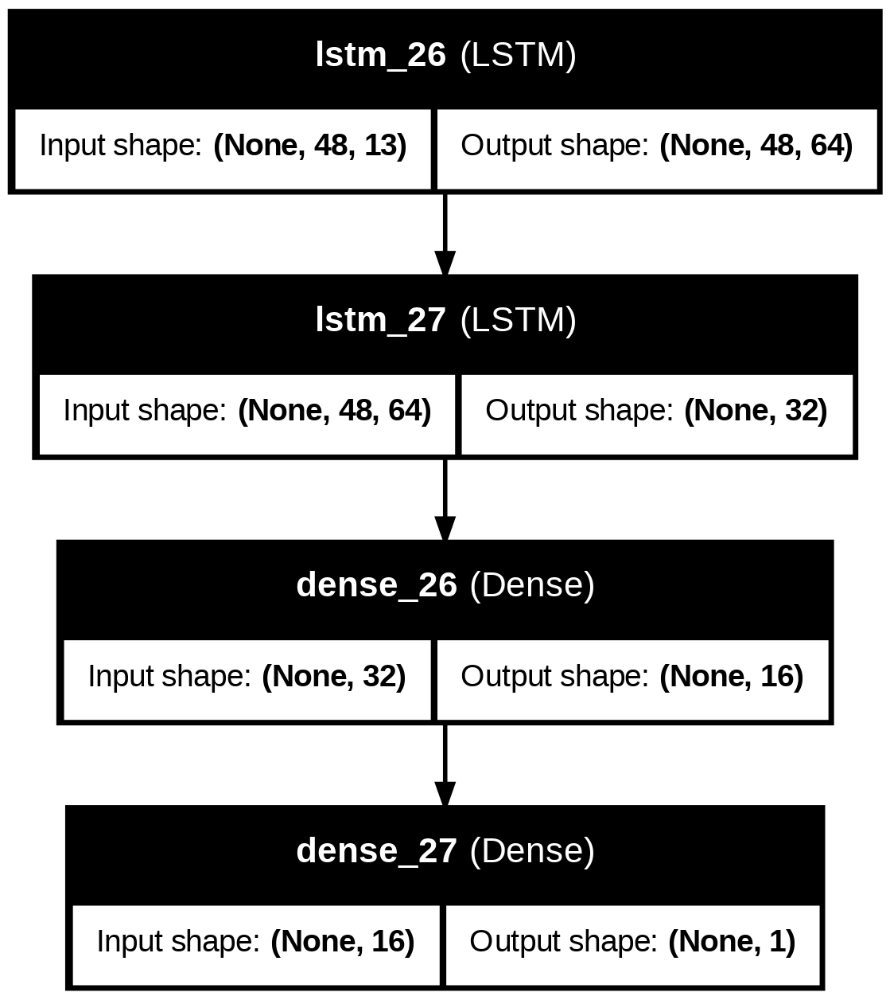

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True)


In [ ]:
for i, layer in enumerate(model.layers):
    weights = layer.get_weights()
    print(f"Layer {i} - {layer.name}:")
    for j, w in enumerate(weights):
        print(f"  Weight {j}: shape = {w.shape}")

Layer 0 - lstm_26:
  Weight 0: shape = (13, 256)
  Weight 1: shape = (64, 256)
  Weight 2: shape = (256,)
Layer 1 - lstm_27:
  Weight 0: shape = (64, 128)
  Weight 1: shape = (32, 128)
  Weight 2: shape = (128,)
Layer 2 - dense_26:
  Weight 0: shape = (32, 16)
  Weight 1: shape = (16,)
Layer 3 - dense_27:
  Weight 0: shape = (16, 1)
  Weight 1: shape = (1,)


In [ ]:
model.fit(X_train, y_train,
          epochs=10,
          batch_size=32,
          validation_data=(X_test, y_test),
          callbacks=[tensorboard_callback])


Epoch 1/10


ValueError: Exception encountered when calling Sequential.call().

[1mInvalid input shape for input Tensor("data:0", shape=(None, 10), dtype=float32). Expected shape (None, 48, 13), but input has incompatible shape (None, 10)[0m

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(None, 10), dtype=float32)
  • training=True
  • mask=None

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step


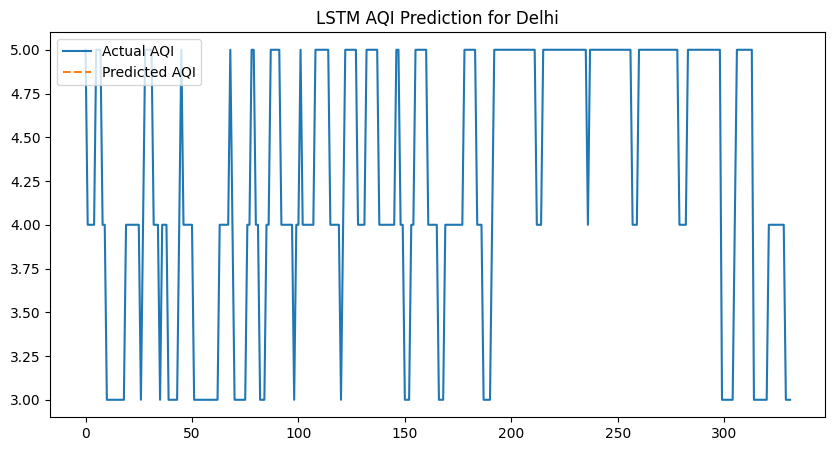

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step


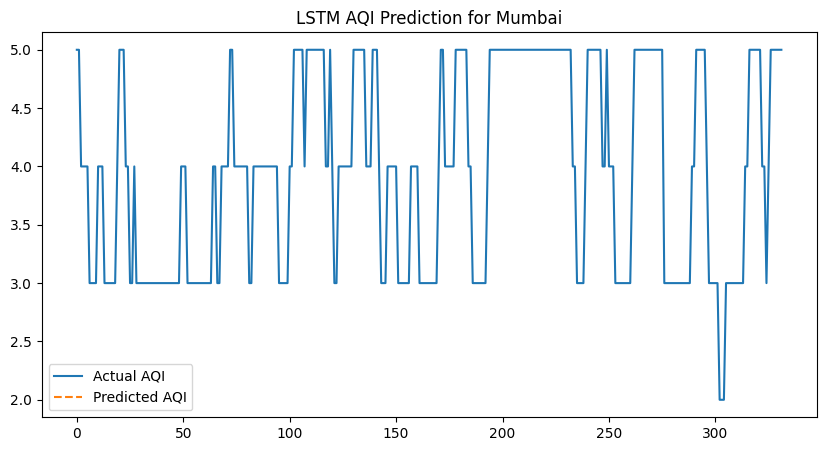

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step


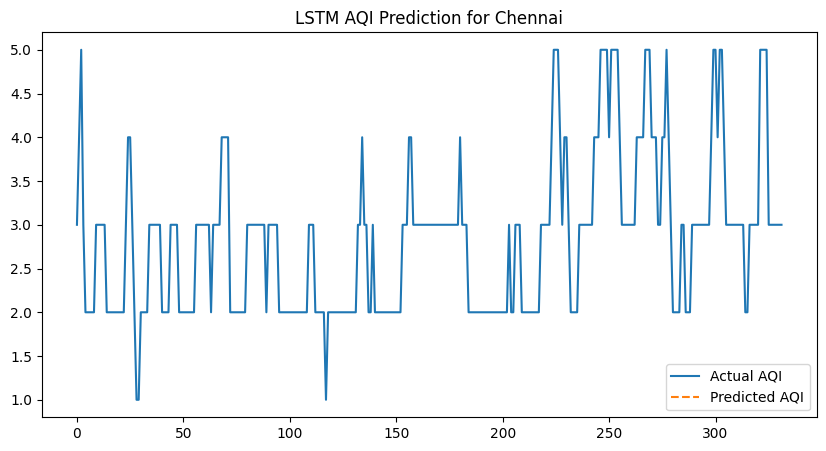

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step


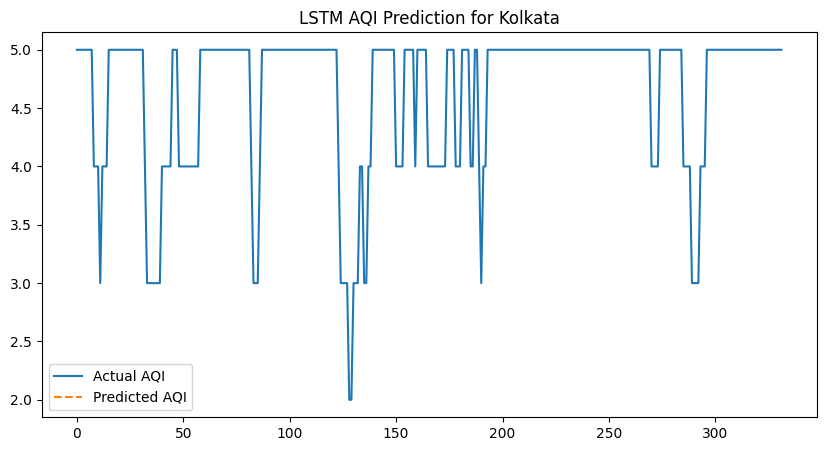

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step


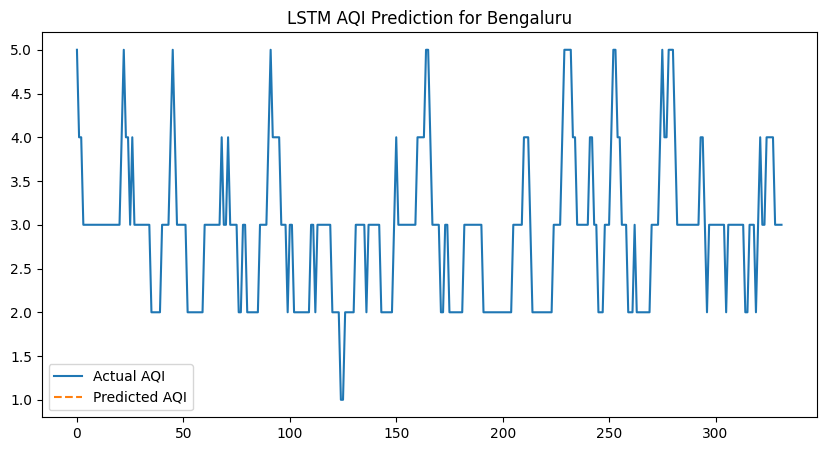

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step


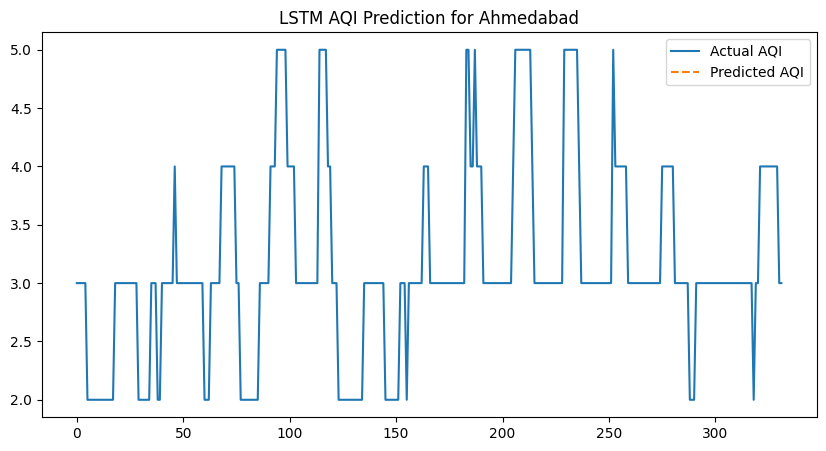

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step


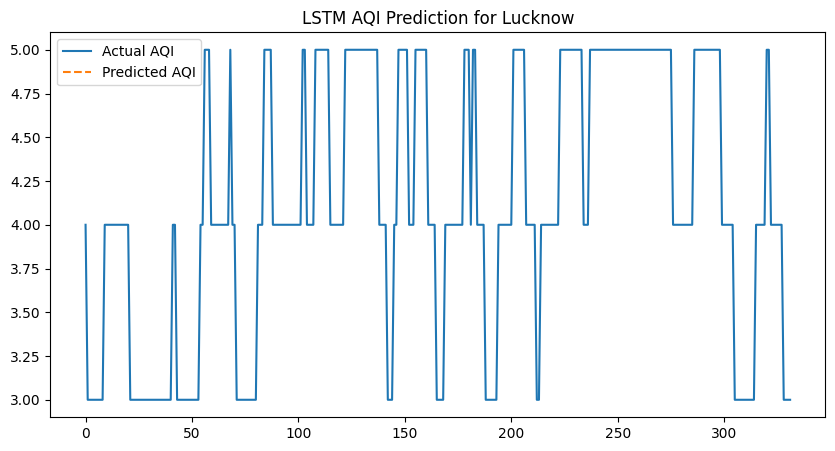

11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step


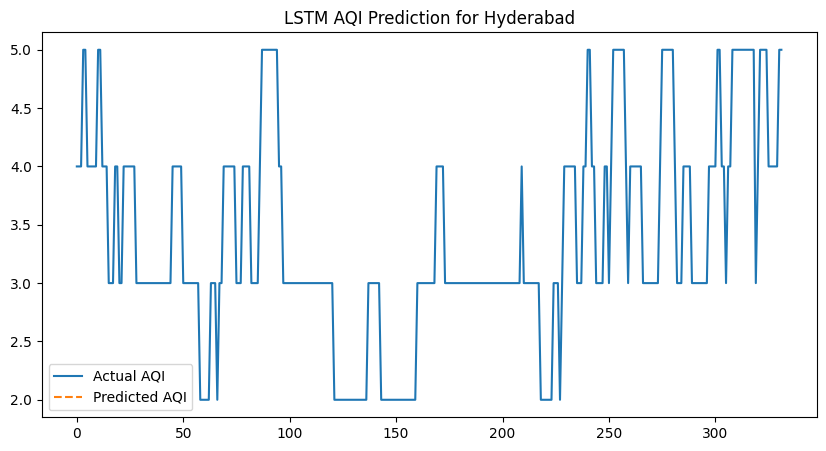

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step


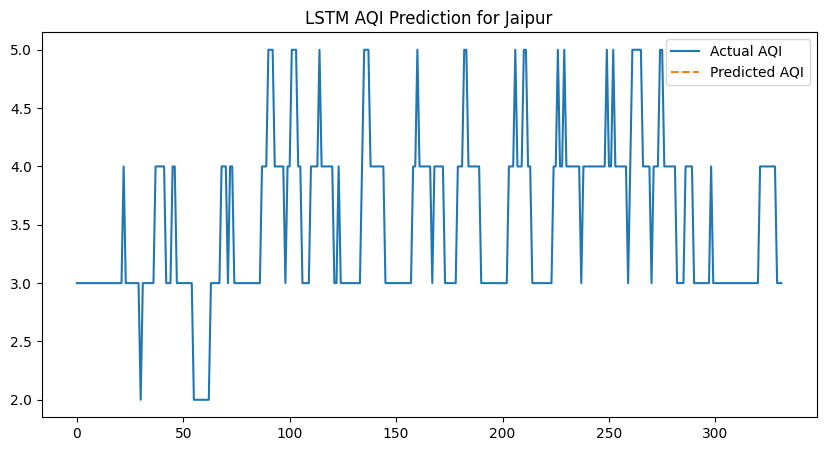

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step


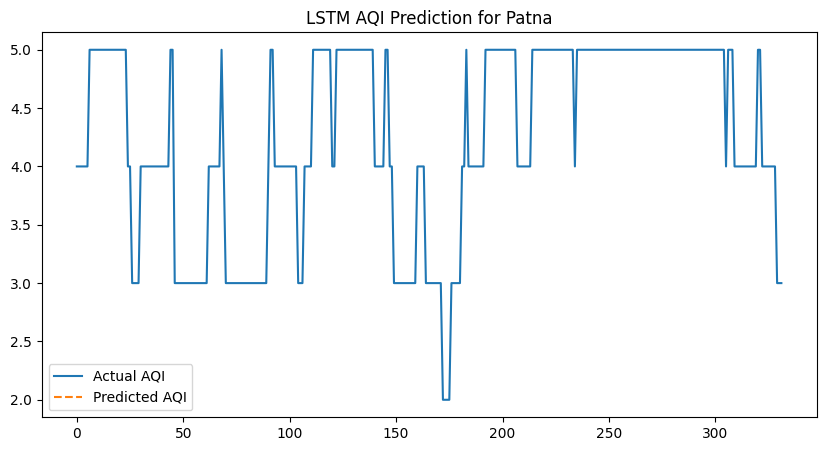

In [ ]:
import matplotlib.pyplot as plt

# Plot results for a city
def plot_results(city):
    model = city_models[city]["model"]
    X_test = city_models[city]["X_test"]
    y_test = city_models[city]["y_test"]

    # Predict
    y_pred = model.predict(X_test)

    # Plot results
    plt.figure(figsize=(10, 5))
    plt.plot(y_test, label="Actual AQI", linestyle="-")
    plt.plot(y_pred, label="Predicted AQI", linestyle="--")
    plt.title(f"LSTM AQI Prediction for {city}")
    plt.legend()
    plt.show()

# Example: Plot results for Delhi
for city in data.city.unique():
  plot_results(city)

In [ ]:
def evaluation_metrics(city):
    model = city_models[city]["model"]
    X_test = city_models[city]["X_test"]
    y_test = city_models[city]["y_test"]

    # Predict
    y_pred = model.predict(X_test).flatten()  # Ensure predictions are 1D

    # Compute error metrics
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Print evaluation metrics for this city
    print(f"\n📌 Evaluation Metrics for {city}:")
    print(f"  - MAE: {mae:.2f}")
    print(f"  - RMSE: {rmse:.2f}")
    print(f"  - R² Score: {r2:.2f}")

for city in data.city.unique():
  evaluation_metrics(city)

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


ValueError: Input contains NaN.

In [ ]:
print(data.isna().sum())  # Check for missing values
print(np.isinf(data[features]).sum())  # Check for infinite values
print(np.isinf(data[target]).sum())  # Check for infinite values in AQI


city            0
lan             0
lot            12
timestamp      12
aqi            12
co             12
no             12
no2            12
o3             12
so2            12
pm2_5          12
pm10           12
nh3            12
temperature    12
humidity       12
datetime       12
hour           12
day_of_week    12
month          12
dtype: int64
co             0
no             0
no2            0
o3             0
so2            0
pm2_5          0
pm10           0
nh3            0
temperature    0
humidity       0
hour           0
day_of_week    0
month          0
dtype: int64
0
